In [1]:
import os

import geopandas
import joblib
import matplotlib.pyplot as plt
import numpy as np
import optuna
import pandas as pd
import seaborn as sns
from geobr import read_municipality
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score, f1_score, roc_auc_score, recall_score, precision_score
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split, cross_val_score

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
pd.set_option('display.max_columns', 30)

plt.style.use("bmh")
plt.rcParams["figure.figsize"] = [10, 6]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"
plt.rcParams["figure.autolayout"] = "true"

%config InlineBackend.figure_format = "retina"

## Leitura dos Dados

Vamos começar abrindo os dados da Case e, com o auxílio do pacote geobr, carregar a geometria dos municipios brasileiros no ano de 2000.

In [3]:
municipios = pd.read_excel("../data/Case Seleção 2022.xls", sheet_name=1, skiprows=3)
geometria = read_municipality(year=2000).drop_duplicates(subset="code_muni")
censo_extra = pd.read_csv("../data/censo_2000_extras.csv")

In [4]:
municipios.head()

,Código,Município,Área (km²),"Densidade demográfica, 2000",Distância à capital (km),"Esperança de vida ao nascer, 2000","Mortalidade até um ano de idade, 2000","Taxa de fecundidade total, 2000","Percentual de pessoas de 25 anos ou mais analfabetas, 2000","Renda per Capita, 2000","Índice de Gini, 2000","Intensidade da indigência, 2000","Intensidade da pobreza, 2000","Índice de Desenvolvimento Humano Municipal, 2000","Taxa bruta de freqüência à escola, 2000","Taxa de alfabetização, 2000","Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000","População de 25 anos ou mais de idade, 1991","População de 25 anos ou mais de idade, 2000","População de 65 anos ou mais de idade, 1991","População de 65 anos ou mais de idade, 2000","População total, 1991","População total, 2000","População urbana, 2000","População rural, 2000"
0,520005,Abadia de Goiás (GO),136.9,36.3,21.414308,67.58,27.70,2.85,15.64,205.27,0.53,36.89,34.40,0.742,80.17,88.03,4.87,1872,2433,121,227,4227,4971,3096,1875
1,310010,Abadia dos Dourados (MG),897.4,7.2,390.876513,72.92,20.51,2.54,14.48,196.36,0.52,51.90,35.22,0.760,74.57,86.58,4.36,3308,3781,354,459,6492,6446,3927,2519
2,520010,Abadiânia (GO),1047.7,10.9,78.641435,69.59,22.36,2.77,21.81,168.31,0.56,47.06,40.32,0.723,74.18,82.45,4.24,4241,5918,446,686,9402,11452,7206,4246
3,150010,Abaetetuba (PA),1613.9,73.8,51.184552,70.77,25.61,3.15,24.85,102.14,0.59,44.61,51.04,0.706,81.76,80.74,4.28,33554,44897,3792,4688,99989,119152,70843,48309
4,310020,Abaeté (MG),1822.4,12.3,172.311549,72.50,21.59,2.41,15.56,253.68,0.58,41.53,31.68,0.778,78.39,87.55,4.78,10163,12406,1084,1595,20689,22360,19022,3338


In [5]:
geometria.head()

,code_muni,name_muni,code_state,abbrev_state,geometry
0,1100015.0,Alta Floresta D'oeste,11.0,RO,"MULTIPOLYGON (((-62.89162 -12.85844, -62.88065..."
1,1100023.0,Ariquemes,11.0,RO,"MULTIPOLYGON (((-63.59644 -9.99999, -63.60434 ..."
2,1100031.0,Cabixi,11.0,RO,"MULTIPOLYGON (((-60.91846 -13.54792, -60.91814..."
3,1100049.0,Cacoal,11.0,RO,"MULTIPOLYGON (((-61.79527 -11.39743, -61.79170..."
4,1100056.0,Cerejeiras,11.0,RO,"MULTIPOLYGON (((-61.90644 -13.27527, -61.90731..."


In [6]:
censo_extra.head()

,id_municipio,prop_pop_trab_remun,prop_migrantes_recentes
0,1400027,0.697124,0.280849
1,1400050,0.619903,0.146547
2,1400100,0.334772,0.255302
3,1400159,0.392777,0.262718
4,1400175,0.342074,0.423969


Antes de iniciar a exploração dos dados, vamos fazer um merge nas duas bases usando o código do município. Note que, na base contendo a geometria o código tem 7 dígitos enquanto que na base do case contém 6. Isso não é um problema, visto que o 7º digito é um verificador. É possível fazer o merge usando só os 6 primeiros digitos.

Assim, antes do merge precisamos remover o 7º digito da base com a geometria e os decimais.

In [7]:
geometria["code_muni"] = geometria["code_muni"].astype(str).str.slice(start=0, stop=6)

In [8]:
geometria.head()

,code_muni,name_muni,code_state,abbrev_state,geometry
0,110001,Alta Floresta D'oeste,11.0,RO,"MULTIPOLYGON (((-62.89162 -12.85844, -62.88065..."
1,110002,Ariquemes,11.0,RO,"MULTIPOLYGON (((-63.59644 -9.99999, -63.60434 ..."
2,110003,Cabixi,11.0,RO,"MULTIPOLYGON (((-60.91846 -13.54792, -60.91814..."
3,110004,Cacoal,11.0,RO,"MULTIPOLYGON (((-61.79527 -11.39743, -61.79170..."
4,110005,Cerejeiras,11.0,RO,"MULTIPOLYGON (((-61.90644 -13.27527, -61.90731..."


Além disso, precisamos também converter a coluna `Código` para uma string, para manter compatibilidade entre as bases e conseguir fazer o merge.

In [9]:
municipios["Código"] = municipios["Código"].astype(str)

In [10]:
municipios.head()

,Código,Município,Área (km²),"Densidade demográfica, 2000",Distância à capital (km),"Esperança de vida ao nascer, 2000","Mortalidade até um ano de idade, 2000","Taxa de fecundidade total, 2000","Percentual de pessoas de 25 anos ou mais analfabetas, 2000","Renda per Capita, 2000","Índice de Gini, 2000","Intensidade da indigência, 2000","Intensidade da pobreza, 2000","Índice de Desenvolvimento Humano Municipal, 2000","Taxa bruta de freqüência à escola, 2000","Taxa de alfabetização, 2000","Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000","População de 25 anos ou mais de idade, 1991","População de 25 anos ou mais de idade, 2000","População de 65 anos ou mais de idade, 1991","População de 65 anos ou mais de idade, 2000","População total, 1991","População total, 2000","População urbana, 2000","População rural, 2000"
0,520005,Abadia de Goiás (GO),136.9,36.3,21.414308,67.58,27.70,2.85,15.64,205.27,0.53,36.89,34.40,0.742,80.17,88.03,4.87,1872,2433,121,227,4227,4971,3096,1875
1,310010,Abadia dos Dourados (MG),897.4,7.2,390.876513,72.92,20.51,2.54,14.48,196.36,0.52,51.90,35.22,0.760,74.57,86.58,4.36,3308,3781,354,459,6492,6446,3927,2519
2,520010,Abadiânia (GO),1047.7,10.9,78.641435,69.59,22.36,2.77,21.81,168.31,0.56,47.06,40.32,0.723,74.18,82.45,4.24,4241,5918,446,686,9402,11452,7206,4246
3,150010,Abaetetuba (PA),1613.9,73.8,51.184552,70.77,25.61,3.15,24.85,102.14,0.59,44.61,51.04,0.706,81.76,80.74,4.28,33554,44897,3792,4688,99989,119152,70843,48309
4,310020,Abaeté (MG),1822.4,12.3,172.311549,72.50,21.59,2.41,15.56,253.68,0.58,41.53,31.68,0.778,78.39,87.55,4.78,10163,12406,1084,1595,20689,22360,19022,3338


In [11]:
censo_extra["id_municipio"] = censo_extra["id_municipio"].astype(str).str.slice(start=0, stop=6)

In [12]:
censo_extra.head()

,id_municipio,prop_pop_trab_remun,prop_migrantes_recentes
0,140002,0.697124,0.280849
1,140005,0.619903,0.146547
2,140010,0.334772,0.255302
3,140015,0.392777,0.262718
4,140017,0.342074,0.423969


Com isso podemos fazer o merge.

In [13]:
municipios_com_geo = geometria.loc[:, ["code_muni", "geometry"]].merge(
    municipios, how="inner", left_on="code_muni", right_on="Código"
).merge(
    censo_extra, how="inner", left_on="code_muni", right_on="id_municipio"
).drop(["code_muni", "id_municipio"], axis=1)

In [14]:
municipios_com_geo.head()

,geometry,Código,Município,Área (km²),"Densidade demográfica, 2000",Distância à capital (km),"Esperança de vida ao nascer, 2000","Mortalidade até um ano de idade, 2000","Taxa de fecundidade total, 2000","Percentual de pessoas de 25 anos ou mais analfabetas, 2000","Renda per Capita, 2000","Índice de Gini, 2000","Intensidade da indigência, 2000","Intensidade da pobreza, 2000","Índice de Desenvolvimento Humano Municipal, 2000","Taxa bruta de freqüência à escola, 2000","Taxa de alfabetização, 2000","Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000","População de 25 anos ou mais de idade, 1991","População de 25 anos ou mais de idade, 2000","População de 65 anos ou mais de idade, 1991","População de 65 anos ou mais de idade, 2000","População total, 1991","População total, 2000","População urbana, 2000","População rural, 2000",prop_pop_trab_remun,prop_migrantes_recentes
0,"MULTIPOLYGON (((-62.89162 -12.85844, -62.88065...",110001,Alta Floresta d'Oeste (RO),7111.8,3.7,415.523881,66.90,28.36,3.11,20.24,188.27,0.58,54.47,46.69,0.715,71.72,84.16,3.77,8872,11804,428,890,23546,26533,12341,14192,0.433599,0.181213
1,"MULTIPOLYGON (((-63.59644 -9.99999, -63.60434 ...",110002,Ariquemes (RO),4995.3,14.9,159.097193,67.61,26.45,2.77,15.60,268.31,0.60,59.68,44.31,0.752,75.88,88.23,4.96,20890,33245,1075,2178,53799,74503,55118,19385,0.426107,0.206019
2,"MULTIPOLYGON (((-60.91846 -13.54792, -60.91814...",110003,Cabixi (RO),1530.7,4.9,640.527835,65.62,31.99,2.95,23.08,172.54,0.56,51.15,48.72,0.705,76.39,82.50,3.60,2967,3512,199,343,7676,7518,2672,4846,0.513576,0.197274
3,"MULTIPOLYGON (((-61.79527 -11.39743, -61.79170...",110004,Cacoal (RO),3808.4,19.3,400.744653,69.70,21.27,2.34,15.65,230.05,0.56,54.06,41.96,0.755,76.25,87.86,4.80,27469,34135,1720,2813,69725,73568,51398,22170,0.466161,0.181428
4,"MULTIPOLYGON (((-61.90644 -13.27527, -61.90731...",110005,Cerejeiras (RO),2645.0,6.9,596.405600,67.76,26.07,2.44,16.65,253.92,0.60,59.37,45.21,0.751,80.28,86.10,4.27,7689,8601,477,830,19371,18207,14846,3361,0.487363,0.194838


Podemos agora observar rapidamente os tipos das colunas e checar se alguma observação com NA.

In [15]:
municipios_com_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 5507 entries, 0 to 5506
Data columns (total 28 columns):
 #   Column                                                                 Non-Null Count  Dtype   
---  ------                                                                 --------------  -----   
 0   geometry                                                               5507 non-null   geometry
 1   Código                                                                 5507 non-null   object  
 2   Município                                                              5507 non-null   object  
 3   Área (km²)                                                             5507 non-null   float64 
 4   Densidade demográfica, 2000                                            5507 non-null   float64 
 5   Distância à capital (km)                                               5507 non-null   float64 
 6   Esperança de vida ao nascer, 2000                                      5

Os dados parecem bem comportados, então podemos partir para a exploração.

## Exploração dos Dados

Antes de começar a modelagem, vamos modificar rapidamente algumas variáveis.

In [16]:
municipios_com_geo.describe()

,Área (km²),"Densidade demográfica, 2000",Distância à capital (km),"Esperança de vida ao nascer, 2000","Mortalidade até um ano de idade, 2000","Taxa de fecundidade total, 2000","Percentual de pessoas de 25 anos ou mais analfabetas, 2000","Renda per Capita, 2000","Índice de Gini, 2000","Intensidade da indigência, 2000","Intensidade da pobreza, 2000","Índice de Desenvolvimento Humano Municipal, 2000","Taxa bruta de freqüência à escola, 2000","Taxa de alfabetização, 2000","Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000","População de 25 anos ou mais de idade, 1991","População de 25 anos ou mais de idade, 2000","População de 65 anos ou mais de idade, 1991","População de 65 anos ou mais de idade, 2000","População total, 1991","População total, 2000","População urbana, 2000","População rural, 2000",prop_pop_trab_remun,prop_migrantes_recentes
count,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5.507000e+03,5.507000e+03,5507.000000,5507.000000,5.507000e+03,5.507000e+03,5.507000e+03,5507.000000,5507.000000,5507.000000
mean,1549.211476,96.731869,253.212620,67.748925,34.083376,2.864845,26.668411,170.814160,0.560734,49.786210,47.086060,0.699339,77.966868,78.230626,4.039279,1.221264e+04,1.551693e+04,1286.757581,1804.085709,2.666167e+04,3.083333e+04,2.505066e+04,5782.678591,0.541330,0.132208
std,5738.392465,524.006185,163.210532,4.860915,18.470551,0.744454,15.164462,96.425347,0.058663,10.571483,10.732511,0.083485,6.708877,12.460251,1.288171,8.923783e+04,1.039028e+05,9290.633699,12584.258093,1.690004e+05,1.867506e+05,1.800123e+05,10438.887430,0.110942,0.076286
min,2.900000,0.100000,0.000000,54.350000,5.380000,1.560000,2.020000,28.380000,0.360000,0.020000,15.760000,0.467000,44.500000,39.340000,0.810000,2.390000e+02,4.220000e+02,17.000000,27.000000,6.180000e+02,7.950000e+02,0.000000e+00,0.000000,0.185494,0.006229
25%,205.700000,11.300000,121.858906,64.530000,18.640000,2.320000,13.970000,86.495000,0.520000,42.830000,38.190000,0.630000,73.990000,67.930000,3.010000,2.119500e+03,2.502000e+03,241.000000,330.500000,4.945000e+03,5.152500e+03,2.402500e+03,1843.000000,0.460729,0.083142
50%,417.200000,23.600000,228.262939,68.240000,29.510000,2.670000,22.600000,159.100000,0.560000,49.510000,46.230000,0.713000,78.400000,82.040000,4.070000,4.084000e+03,4.930000e+03,483.000000,652.000000,9.748000e+03,1.041800e+04,5.314000e+03,3666.000000,0.521379,0.114047
75%,1031.450000,48.000000,358.072044,71.440000,46.150000,3.230000,39.780000,232.695000,0.600000,56.455000,55.410000,0.768000,82.390000,88.340000,4.910000,8.104000e+03,1.004000e+04,988.000000,1321.500000,1.897450e+04,2.135650e+04,1.324050e+04,7223.000000,0.606074,0.159033
max,161445.900000,12881.400000,1474.314590,78.180000,109.670000,7.790000,70.260000,954.650000,0.820000,88.350000,83.030000,0.919000,107.690000,99.090000,9.650000,5.106165e+06,5.825893e+06,499880.000000,670780.000000,9.649519e+06,1.043425e+07,9.813187e+06,621065.000000,0.926796,0.746964


In [17]:
colunas_porc = [
    "Percentual de pessoas de 25 anos ou mais analfabetas, 2000",
    "Intensidade da indigência, 2000",
    "Intensidade da pobreza, 2000",
    "Taxa bruta de freqüência à escola, 2000",
    "Taxa de alfabetização, 2000"
]

colunas_normalizar = [
    "Mortalidade até um ano de idade, 2000", # a cada 1000
    "Taxa de fecundidade total, 2000", # a cada 1000,
    "Taxa bruta de freqüência à escola, 2000", # a cada 1000,
    "Esperança de vida ao nascer, 2000"
]

colunas_log = [
    "Área (km²)",
    "Densidade demográfica, 2000",
    "Distância à capital (km)",
    "Renda per Capita, 2000"
]

for col in colunas_porc:
    municipios_com_geo[col] = municipios_com_geo[col] / 100
    
for col in colunas_log:
    municipios_com_geo[col] = np.log1p(municipios_com_geo[col])
    
for col in colunas_normalizar:
    municipios_com_geo[col] = (municipios_com_geo[col] - municipios_com_geo[col].min()) / (municipios_com_geo[col].max() - municipios_com_geo[col].min())

### Análise Univariada

<AxesSubplot: label='rendapc', xlabel='Renda per Capita, 2000', ylabel='Count'>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


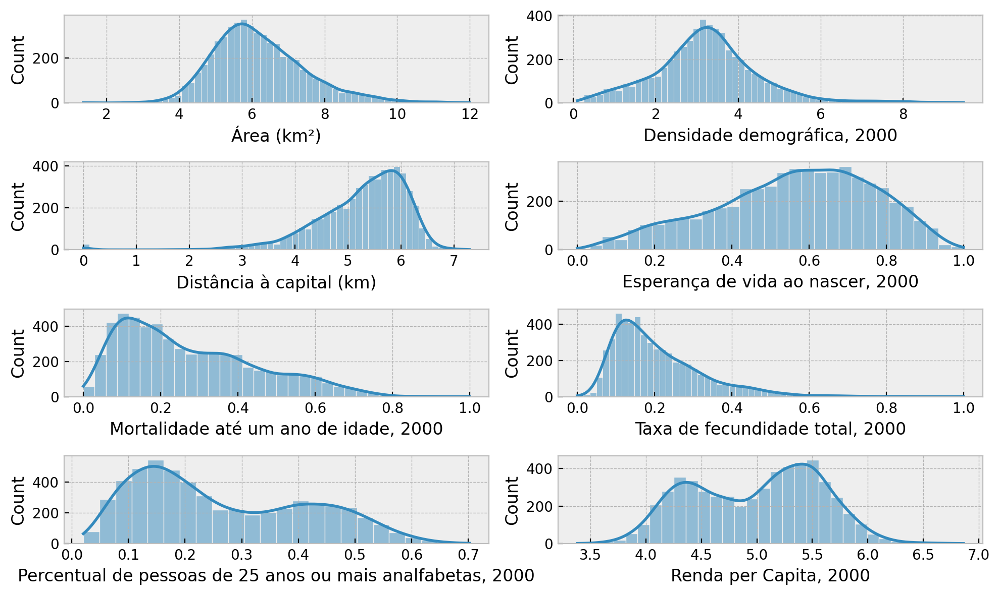

In [18]:
fig, ax =  plt.subplot_mosaic([
    ["area", "densidade"],
    ["distancia", "esp_vida"],
    ["mort_um_ano", "tx_de_fec"],
    ["perc_25+_analf", "rendapc"]
])

sns.histplot(x="Área (km²)", data=municipios_com_geo, kde=True, ax=ax["area"])
sns.histplot(x="Densidade demográfica, 2000", data=municipios_com_geo, kde=True, ax=ax["densidade"])
sns.histplot(x="Distância à capital (km)", data=municipios_com_geo, kde=True, ax=ax["distancia"])
sns.histplot(x="Esperança de vida ao nascer, 2000", data=municipios_com_geo, kde=True, ax=ax["esp_vida"])
sns.histplot(x="Mortalidade até um ano de idade, 2000", data=municipios_com_geo, kde=True, ax=ax["mort_um_ano"])
sns.histplot(x="Taxa de fecundidade total, 2000", data=municipios_com_geo, kde=True, ax=ax["tx_de_fec"])
sns.histplot(x="Percentual de pessoas de 25 anos ou mais analfabetas, 2000", data=municipios_com_geo, kde=True, ax=ax["perc_25+_analf"])
sns.histplot(x="Renda per Capita, 2000", data=municipios_com_geo, kde=True, ax=ax["rendapc"])

<AxesSubplot: label='anos_est', xlabel='Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000', ylabel='Count'>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


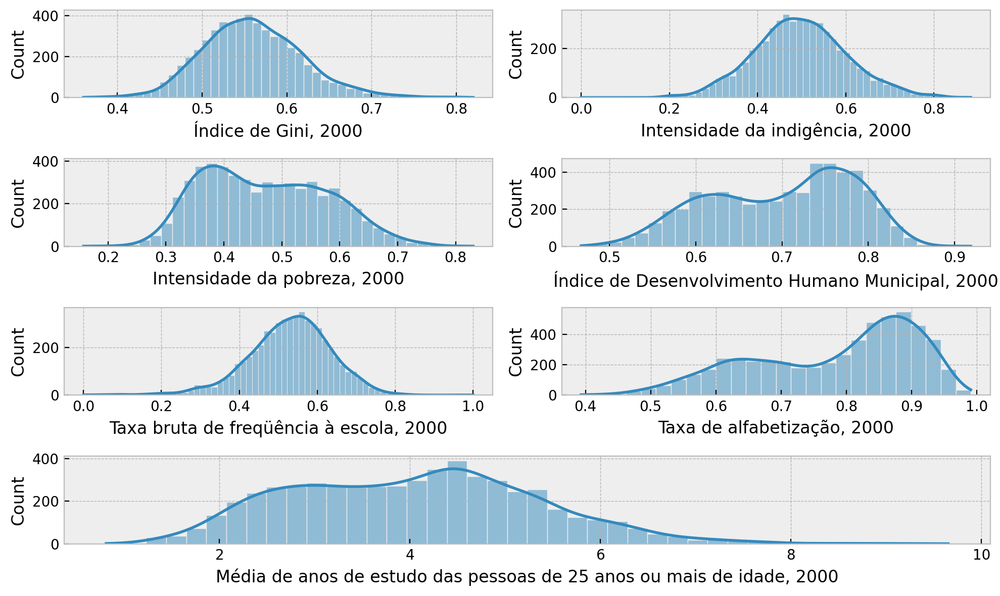

In [19]:
fig, ax =  plt.subplot_mosaic([
    ["gini", "indig"],
    ["pobr", "idh"],
    ["freq_escola", "tx_alfab"],
    ["anos_est", "anos_est"]
])

sns.histplot(x="Índice de Gini, 2000", data=municipios_com_geo, kde=True, binwidth=0.01, ax=ax["gini"])
sns.histplot(x="Intensidade da indigência, 2000", data=municipios_com_geo, kde=True, ax=ax["indig"])
sns.histplot(x="Intensidade da pobreza, 2000", data=municipios_com_geo, kde=True, ax=ax["pobr"])
sns.histplot(x="Índice de Desenvolvimento Humano Municipal, 2000", data=municipios_com_geo, kde=True, ax=ax["idh"])
sns.histplot(x="Taxa bruta de freqüência à escola, 2000", data=municipios_com_geo, kde=True, ax=ax["freq_escola"])
sns.histplot(x="Taxa de alfabetização, 2000", data=municipios_com_geo, kde=True, ax=ax["tx_alfab"])
sns.histplot(x="Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000", data=municipios_com_geo, kde=True, ax=ax["anos_est"])

<AxesSubplot: label='pop_rur_00', xlabel='População rural, 2000', ylabel='Count'>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


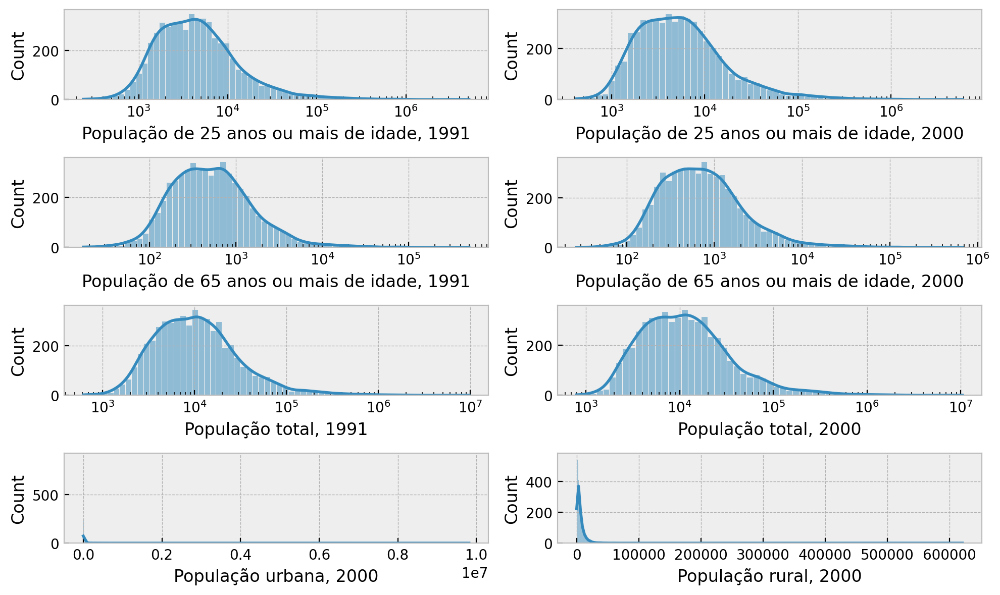

In [20]:
fig, ax =  plt.subplot_mosaic([
    ["pop_25_91", "pop_25_00"],
    ["pop_65_91", "pop_65_00"],
    ["pop_total_91", "pop_total_00"],
    ["pop_urb_00", "pop_rur_00"]
])

sns.histplot(x="População de 25 anos ou mais de idade, 1991", data=municipios_com_geo, kde=True, log_scale=True, ax=ax["pop_25_91"])
sns.histplot(x="População de 25 anos ou mais de idade, 2000", data=municipios_com_geo, kde=True, log_scale=True, ax=ax["pop_25_00"])
sns.histplot(x="População de 65 anos ou mais de idade, 1991", data=municipios_com_geo, kde=True, log_scale=True, ax=ax["pop_65_91"])
sns.histplot(x="População de 65 anos ou mais de idade, 2000", data=municipios_com_geo, kde=True, log_scale=True, ax=ax["pop_65_00"])
sns.histplot(x="População total, 1991", data=municipios_com_geo, kde=True, log_scale=True, ax=ax["pop_total_91"])
sns.histplot(x="População total, 2000", data=municipios_com_geo, kde=True, log_scale=True, ax=ax["pop_total_00"])
sns.histplot(x="População urbana, 2000", data=municipios_com_geo, kde=True, ax=ax["pop_urb_00"])
sns.histplot(x="População rural, 2000", data=municipios_com_geo, kde=True, ax=ax["pop_rur_00"])

<AxesSubplot: label='prop_migrantes_recentes', xlabel='prop_migrantes_recentes', ylabel='Count'>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


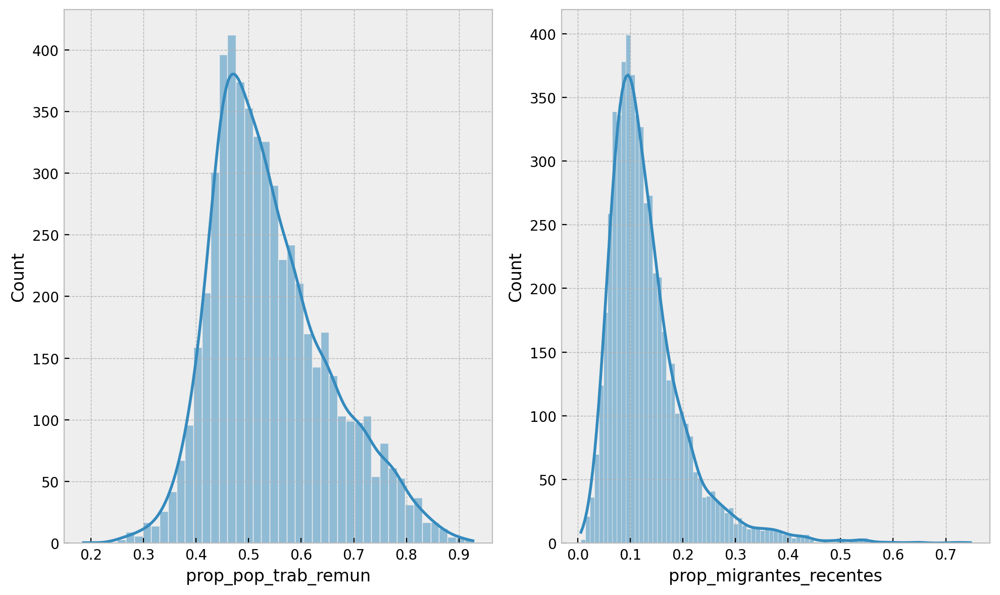

In [21]:
fig, ax =  plt.subplot_mosaic([["prop_pop_trab_remun", "prop_migrantes_recentes"]])

sns.histplot(x="prop_pop_trab_remun", data=municipios_com_geo, kde=True, ax=ax["prop_pop_trab_remun"])
sns.histplot(x="prop_migrantes_recentes", data=municipios_com_geo, kde=True, ax=ax["prop_migrantes_recentes"])

Podemos ainda criar algumas variáveis
- taxa de crescimento pop 25+ anos
- taxa de crescimento pop 65+ anos
- prop pop 25+ anos
- prop pop 65+ anos
- prop pop urbana
- prop pop rural

In [22]:
municipios_com_geo["tx_cresc_pop"] = municipios_com_geo["População total, 2000"]/municipios_com_geo["População total, 1991"] - 1
municipios_com_geo["tx_cresc_pop25"] = municipios_com_geo["População de 25 anos ou mais de idade, 2000"]/municipios_com_geo["População de 25 anos ou mais de idade, 1991"] - 1
municipios_com_geo["tx_cresc_pop65"] = municipios_com_geo["População de 65 anos ou mais de idade, 2000"]/municipios_com_geo["População de 65 anos ou mais de idade, 1991"] - 1
municipios_com_geo["prop_pop_25_2000"] = municipios_com_geo["População de 25 anos ou mais de idade, 2000"]/municipios_com_geo["População total, 2000"]
municipios_com_geo["prop_pop_65_2000"] = municipios_com_geo["População de 65 anos ou mais de idade, 2000"]/municipios_com_geo["População total, 2000"]
municipios_com_geo["prop_pop_urbana_2000"] = municipios_com_geo["População urbana, 2000"]/municipios_com_geo["População total, 2000"]

<AxesSubplot: label='prop_urbana', xlabel='prop_pop_urbana_2000', ylabel='Count'>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


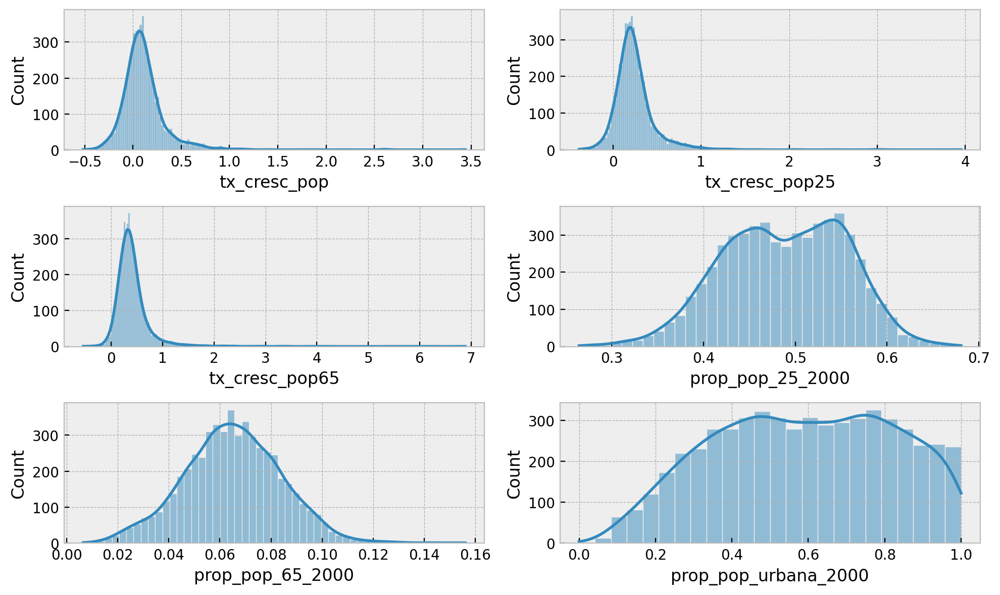

In [23]:
fig, ax = plt.subplot_mosaic([
    ["cresc_pop", "cresc_25"],
    ["cresc_65", "prop_25"],
    ["prop_65", "prop_urbana"]
])

sns.histplot(x="tx_cresc_pop", data=municipios_com_geo, kde=True, ax=ax["cresc_pop"])
sns.histplot(x="tx_cresc_pop25", data=municipios_com_geo, kde=True, ax=ax["cresc_25"])
sns.histplot(x="tx_cresc_pop65", data=municipios_com_geo, kde=True, ax=ax["cresc_65"])
sns.histplot(x="prop_pop_25_2000", data=municipios_com_geo, kde=True, ax=ax["prop_25"])
sns.histplot(x="prop_pop_65_2000", data=municipios_com_geo, kde=True, ax=ax["prop_65"])
sns.histplot(x="prop_pop_urbana_2000", data=municipios_com_geo, kde=True, ax=ax["prop_urbana"])

Coisas a se notar:

- Distribuições bimodais indicando ao menos dois clusters

### Análise Espacial

In [24]:
def plot_map(column, legend=True, ax=None, legend_kwds=None):
    if not ax:
        fig, ax = plt.subplots()
    municipios_com_geo.plot(column=column, legend=legend, ax=ax, legend_kwds=legend_kwds)
    ax.set_title(column)
    return ax

<AxesSubplot: label='esp_vida', title={'center': 'Esperança de vida ao nascer, 2000'}>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


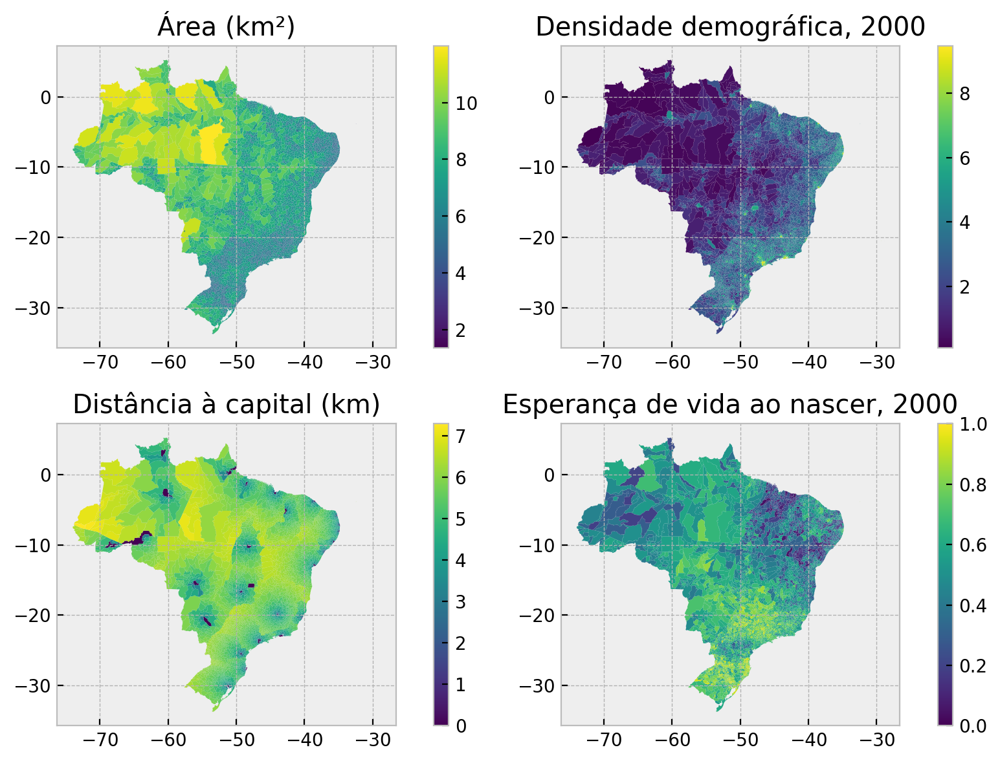

In [25]:
fig, ax =  plt.subplot_mosaic([
    ["area", "densidade"],
    ["distancia", "esp_vida"],
])

plot_map(column="Área (km²)", ax=ax["area"])
plot_map(column="Densidade demográfica, 2000", ax=ax["densidade"])
plot_map(column="Distância à capital (km)", ax=ax["distancia"])
plot_map(column="Esperança de vida ao nascer, 2000", ax=ax["esp_vida"])

<AxesSubplot: label='gini', title={'center': 'Índice de Gini, 2000'}>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


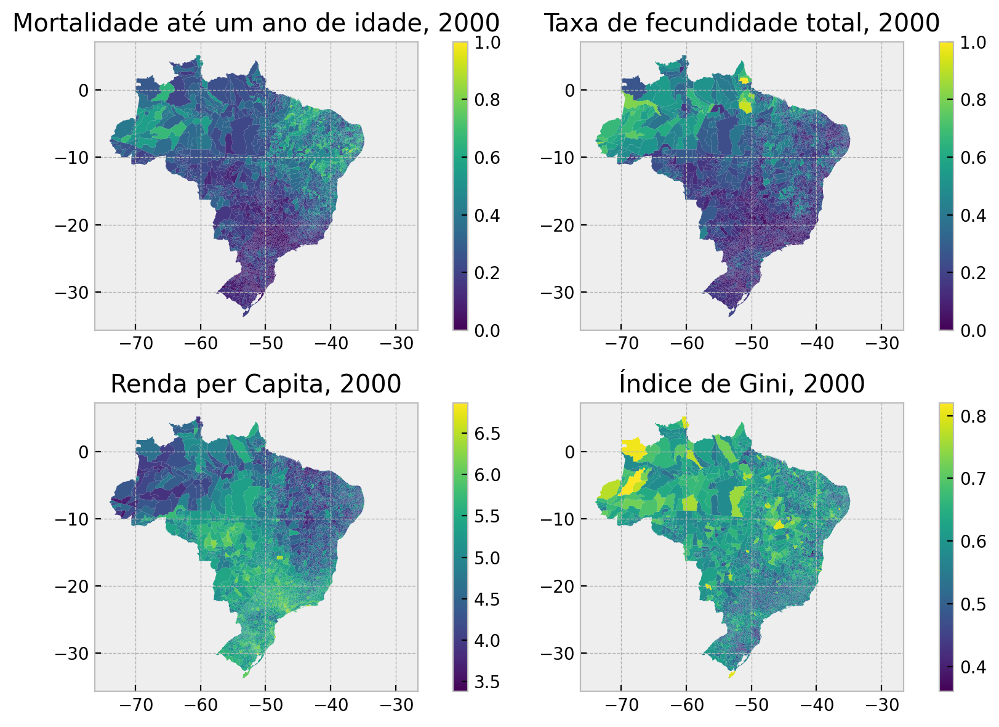

In [26]:
fig, ax =  plt.subplot_mosaic([
    ["mort_um_ano", "tx_de_fec"],
    ["rendapc", "gini"]
])

plot_map(column="Mortalidade até um ano de idade, 2000", ax=ax["mort_um_ano"])
plot_map(column="Taxa de fecundidade total, 2000", ax=ax["tx_de_fec"])
plot_map(column="Renda per Capita, 2000", ax=ax["rendapc"])
plot_map(column="Índice de Gini, 2000", ax=ax["gini"])

<AxesSubplot: label='idh', title={'center': 'Índice de Desenvolvimento Humano Municipal, 2000'}>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


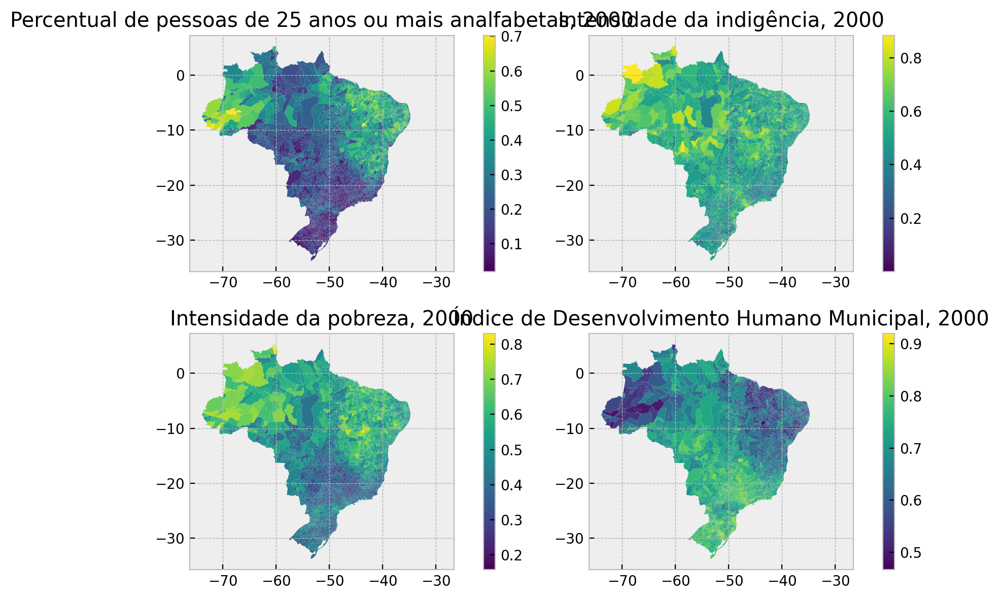

In [27]:
fig, ax =  plt.subplot_mosaic([
    ["perc_25+_analf", "indig"],
    ["pobr", "idh"]
])

plot_map(column="Percentual de pessoas de 25 anos ou mais analfabetas, 2000", ax=ax["perc_25+_analf"])
plot_map(column="Intensidade da indigência, 2000", ax=ax["indig"])
plot_map(column="Intensidade da pobreza, 2000", ax=ax["pobr"])
plot_map(column="Índice de Desenvolvimento Humano Municipal, 2000", ax=ax["idh"])

<AxesSubplot: label='anos_est', title={'center': 'Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000'}>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


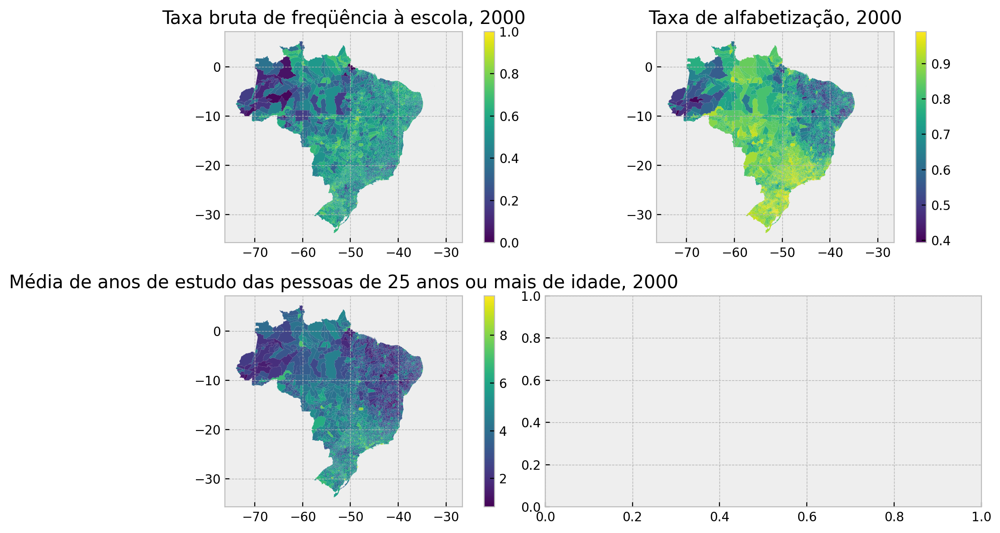

In [28]:
fig, ax =  plt.subplot_mosaic([
    ["freq_escola", "tx_alfab"],
    ["anos_est", ""]
])

plot_map(column="Taxa bruta de freqüência à escola, 2000", ax=ax["freq_escola"])
plot_map(column="Taxa de alfabetização, 2000", ax=ax["tx_alfab"])
plot_map(column="Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000", ax=ax["anos_est"])

<AxesSubplot: label='prop_pop_25_2000', title={'center': 'prop_pop_25_2000'}>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


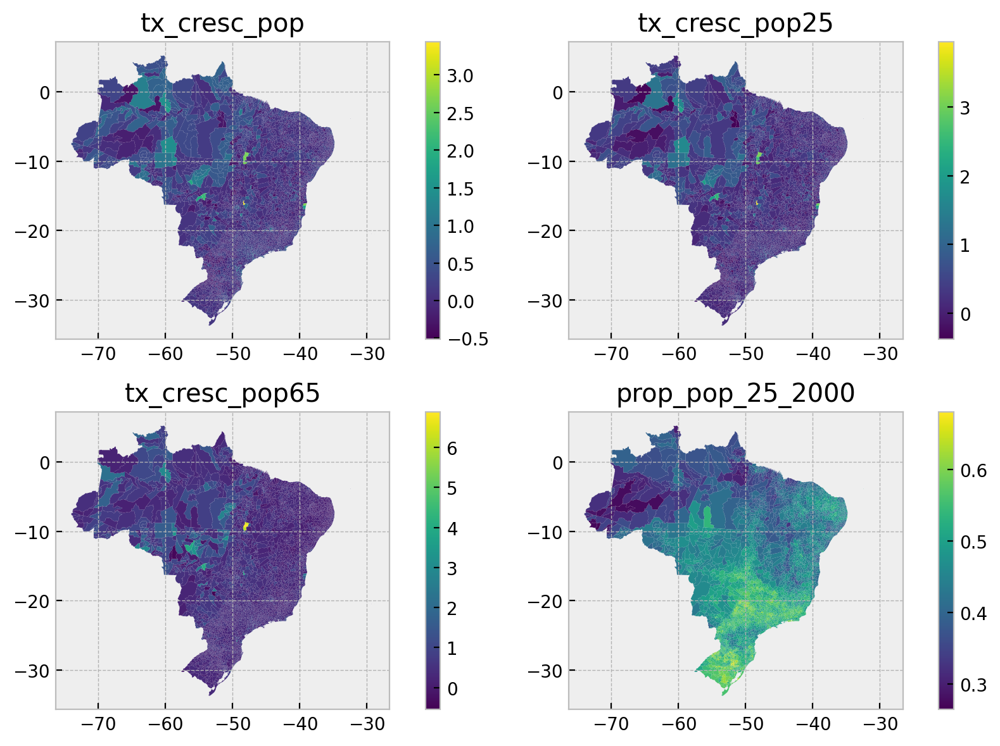

In [29]:
fig, ax =  plt.subplot_mosaic([
    ["tx_cresc_pop", "tx_cresc_pop25"],
    ["tx_cresc_pop65", "prop_pop_25_2000"]
])

plot_map(column="tx_cresc_pop", ax=ax["tx_cresc_pop"])
plot_map(column="tx_cresc_pop25", ax=ax["tx_cresc_pop25"])
plot_map(column="tx_cresc_pop65", ax=ax["tx_cresc_pop65"])
plot_map(column="prop_pop_25_2000", ax=ax["prop_pop_25_2000"])

<AxesSubplot: label='prop_pop_urbana_2000', title={'center': 'prop_pop_urbana_2000'}>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


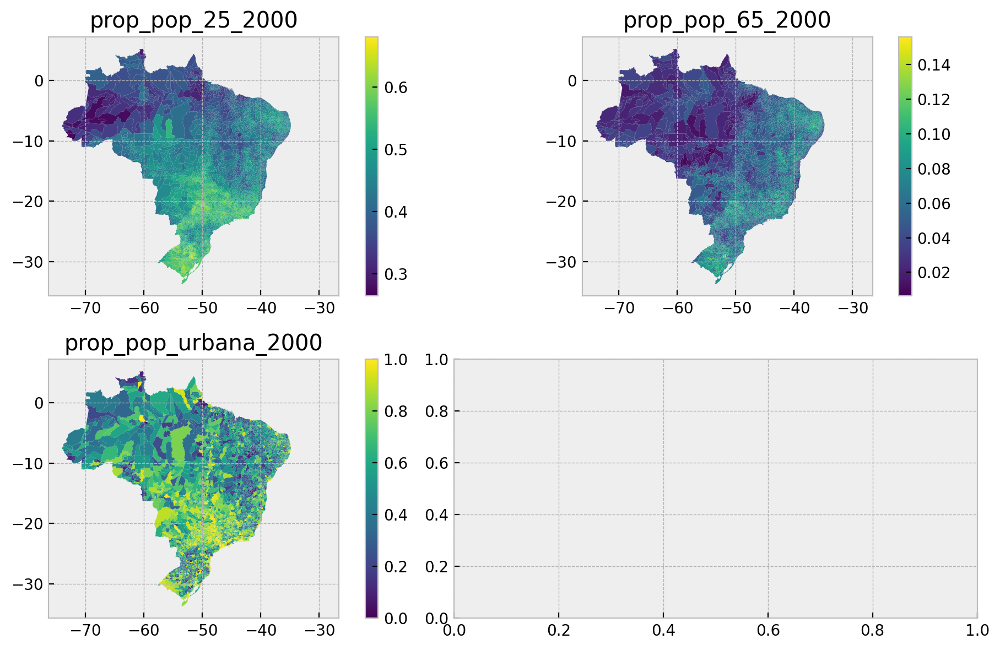

In [30]:
fig, ax =  plt.subplot_mosaic([
    ["prop_pop_25_2000", "prop_pop_65_2000"],
    ["prop_pop_urbana_2000", ""]
])

plot_map(column="prop_pop_25_2000", ax=ax["prop_pop_25_2000"])
plot_map(column="prop_pop_65_2000", ax=ax["prop_pop_65_2000"])
plot_map(column="prop_pop_urbana_2000", ax=ax["prop_pop_urbana_2000"])

## Modelagem - Aprendizado Não-Supervisionado

### Modelo 1

Kmeans com todas as features

In [31]:
features_modelo1 = [
    "Área (km²)",
    "Densidade demográfica, 2000",
    "Distância à capital (km)",
    "Esperança de vida ao nascer, 2000",
    "Mortalidade até um ano de idade, 2000",
    "Taxa de fecundidade total, 2000",
    "Percentual de pessoas de 25 anos ou mais analfabetas, 2000",
    "Renda per Capita, 2000",
    "Índice de Gini, 2000",
    "Intensidade da indigência, 2000",
    "Intensidade da pobreza, 2000",
    "Índice de Desenvolvimento Humano Municipal, 2000",
    "Taxa bruta de freqüência à escola, 2000",
    "Taxa de alfabetização, 2000",
    "Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000",
    "prop_pop_trab_remun",
    "prop_migrantes_recentes",
    "tx_cresc_pop",
    "tx_cresc_pop25",
    "tx_cresc_pop65",
    "prop_pop_25_2000",
    "prop_pop_65_2000",
    "prop_pop_urbana_2000"
]

municipios_com_features1 = municipios_com_geo[features_modelo1]

In [32]:
# Determinando o nº de clusters
def plot_inertia_and_silhouette(features, n_clusters):
    clusters = list(range(2, n_clusters+1))
    inertia = []
    silhouette = []
    for k in clusters:
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(features)
        # inertia
        inertia.append(kmeans.inertia_)
        # silhouette
        silhouette.append(silhouette_score(features, kmeans.labels_))
        
    fig, ax = plt.subplots(nrows=2)
    ax[0].plot(clusters, inertia, marker="o")
    ax[0].set_title("Inertia")
    ax[1].plot(clusters, silhouette, marker="o")
    ax[1].set_title("Silhouette")
    return ax

array([<AxesSubplot: title={'center': 'Inertia'}>,
       <AxesSubplot: title={'center': 'Silhouette'}>], dtype=object)

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


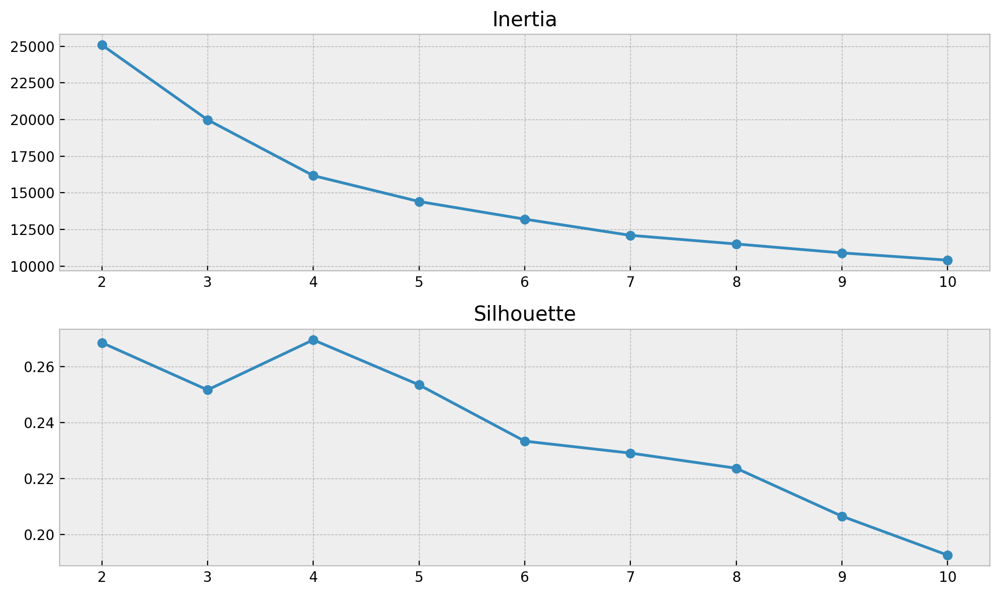

In [33]:
plot_inertia_and_silhouette(municipios_com_features1, 10)

In [34]:
kmeans1 = KMeans(n_clusters=5)
y_pred = kmeans1.fit_predict(municipios_com_features1)

In [35]:
municipios_com_geo["y_pred_mod1"] = y_pred

<AxesSubplot: >

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


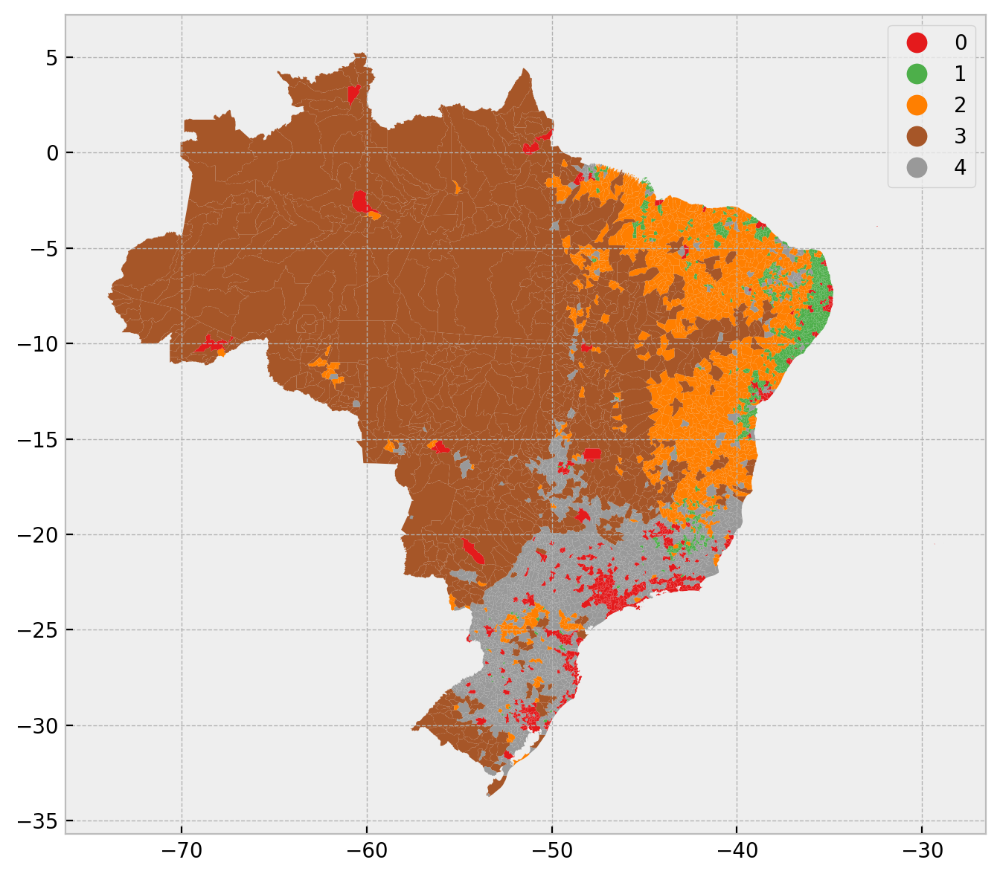

In [36]:
municipios_com_geo.plot(column="y_pred_mod1", legend=True, categorical=True, cmap="Set1")

In [37]:
municipios_com_geo.groupby("y_pred_mod1").size()

y_pred_mod1
0     550
1     885
2    1183
3     789
4    2100
dtype: int64

### Modelo 2 

Kmeans sem correlacionados ao PIB Per Capita

In [38]:
features_modelo2 = [
    "Área (km²)",
    "Densidade demográfica, 2000",
    "Distância à capital (km)",
    #"Esperança de vida ao nascer, 2000",
    #"Mortalidade até um ano de idade, 2000",
    "Taxa de fecundidade total, 2000",
    #"Percentual de pessoas de 25 anos ou mais analfabetas, 2000",
    "Renda per Capita, 2000",
    "Índice de Gini, 2000",
    "Intensidade da indigência, 2000",
    #"Intensidade da pobreza, 2000",
    #"Índice de Desenvolvimento Humano Municipal, 2000",
    "Taxa bruta de freqüência à escola, 2000",
    #"Taxa de alfabetização, 2000",
    #"Média de anos de estudo das pessoas de 25 anos ou mais de idade, 2000",
    "prop_pop_trab_remun",
    "prop_migrantes_recentes",
    "tx_cresc_pop",
    "tx_cresc_pop25",
    "tx_cresc_pop65",
    "prop_pop_25_2000",
    "prop_pop_65_2000",
    "prop_pop_urbana_2000"
]

municipios_com_features2 = municipios_com_geo[features_modelo2]

array([<AxesSubplot: title={'center': 'Inertia'}>,
       <AxesSubplot: title={'center': 'Silhouette'}>], dtype=object)

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


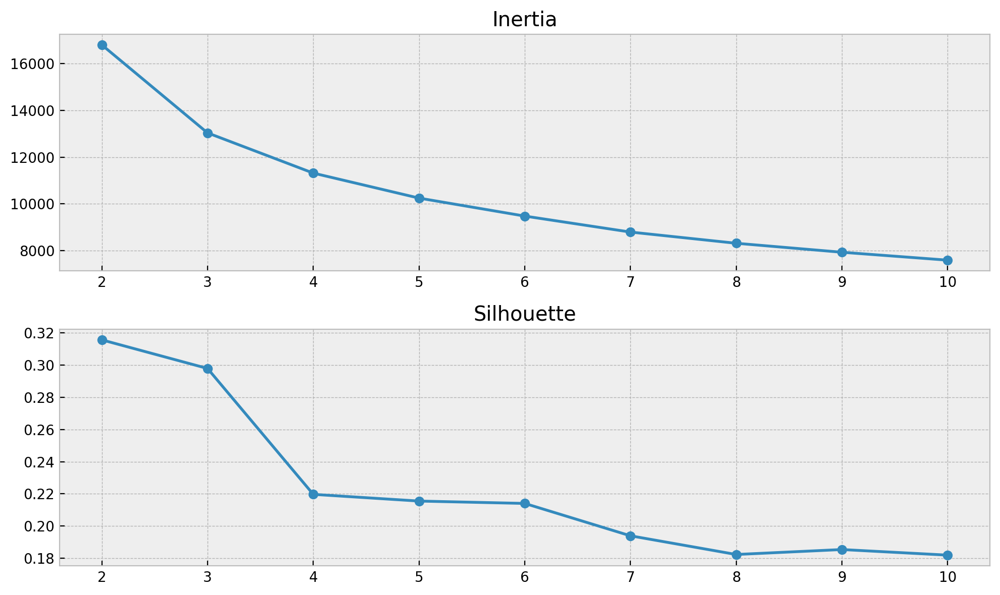

In [39]:
plot_inertia_and_silhouette(municipios_com_features2, 10)

In [40]:
kmeans2 = KMeans(n_clusters=5)
y_pred = kmeans2.fit_predict(municipios_com_features2)
municipios_com_geo["y_pred_mod2"] = y_pred

<AxesSubplot: >

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


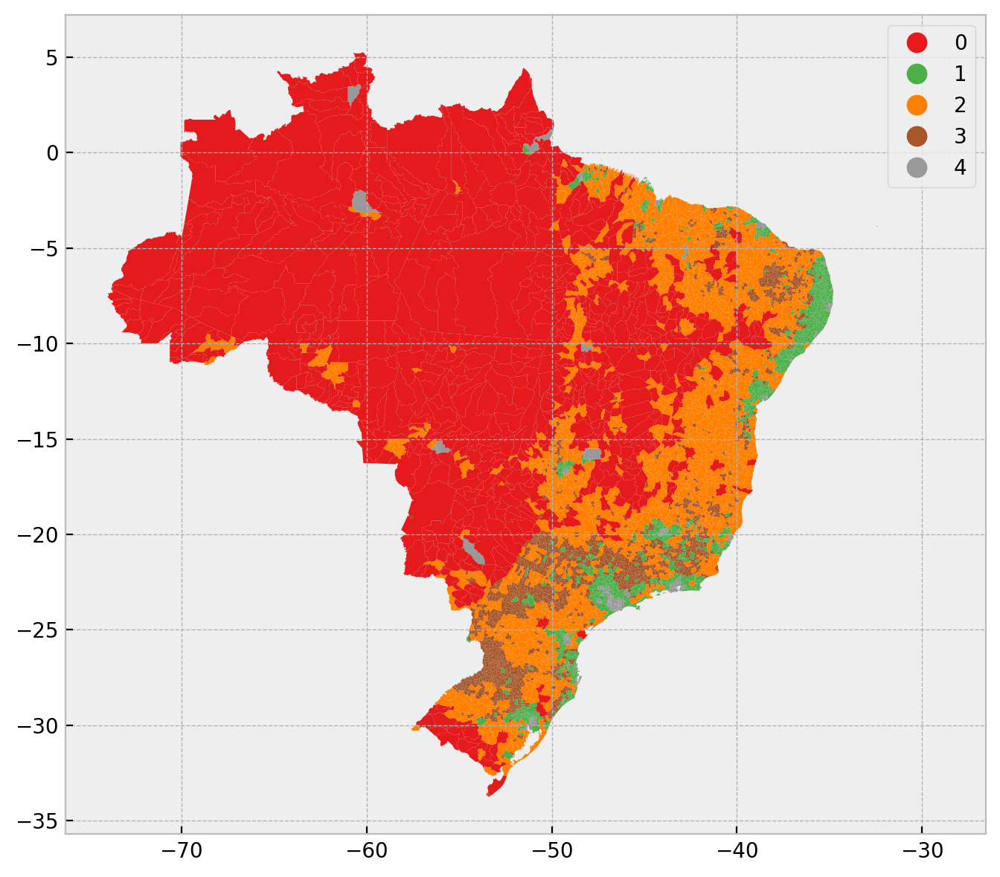

In [41]:
municipios_com_geo.plot(column="y_pred_mod2", legend=True, categorical=True, cmap="Set1")

<AxesSubplot: xlabel='y_pred_mod2', ylabel='Renda per Capita, 2000'>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


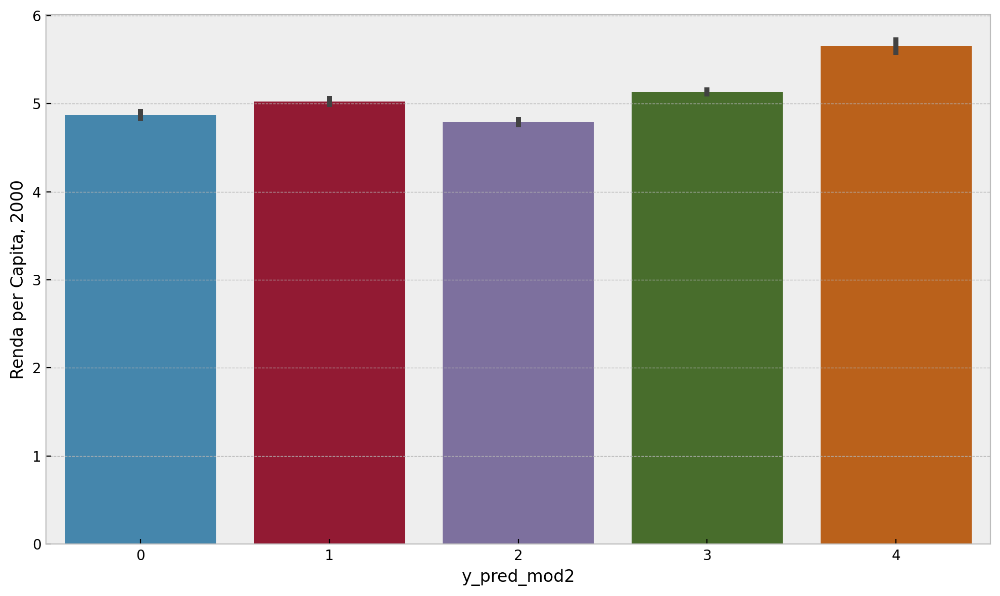

In [42]:
sns.barplot(x="y_pred_mod2", y="Renda per Capita, 2000", data=municipios_com_geo)

In [43]:
municipios_com_geo.groupby("y_pred_mod2").size()

y_pred_mod2
0     687
1    1056
2    1743
3    1854
4     167
dtype: int64

### Modelo 3

Gaussian Mixture com todas as features

In [44]:
def serch_best_hyperparams(features, n_components, iterations=10, **gaussiankwargs):
    K = []
    bic = []
    aic = []
    for i in range(iterations):
        for k in range(2, n_components):
            gm = GaussianMixture(n_components=n_components, **gaussiankwargs)
            gm.fit(features)
            K.append(k)
            bic.append(gm.bic(features))
            aic.append(gm.aic(features))
        print(f"Iteração {i+1} concluída.")
    params_df = pd.DataFrame(data=zip(K, bic, aic), columns=["n_components", "bic", "aic"])
    return params_df.groupby("n_components").mean()

In [45]:
#df = serch_best_hyperparams(municipios_com_features1, 10, iterations=5, n_init=5)

In [46]:
#df.sort_values("bic")

In [47]:
gm = GaussianMixture(n_components=8, random_state=42)
y_pred = gm.fit_predict(municipios_com_features1)
joblib.dump(gm, "../models/gmm1.pkl")

['../models/gmm1.pkl']

In [48]:
municipios_com_geo["y_pred_mod3"] = y_pred

<AxesSubplot: >

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


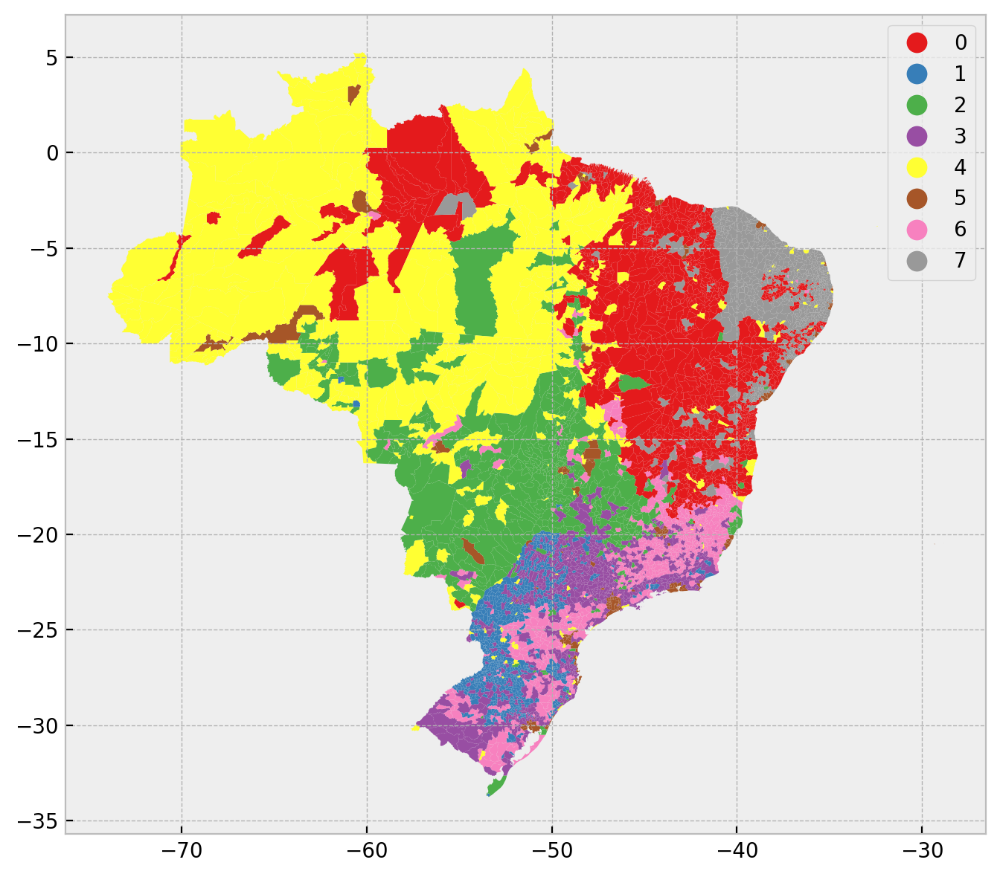

In [49]:
municipios_com_geo.plot(column="y_pred_mod3", legend=True, categorical=True, cmap="Set1")

<AxesSubplot: xlabel='y_pred_mod3', ylabel='Renda per Capita, 2000'>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


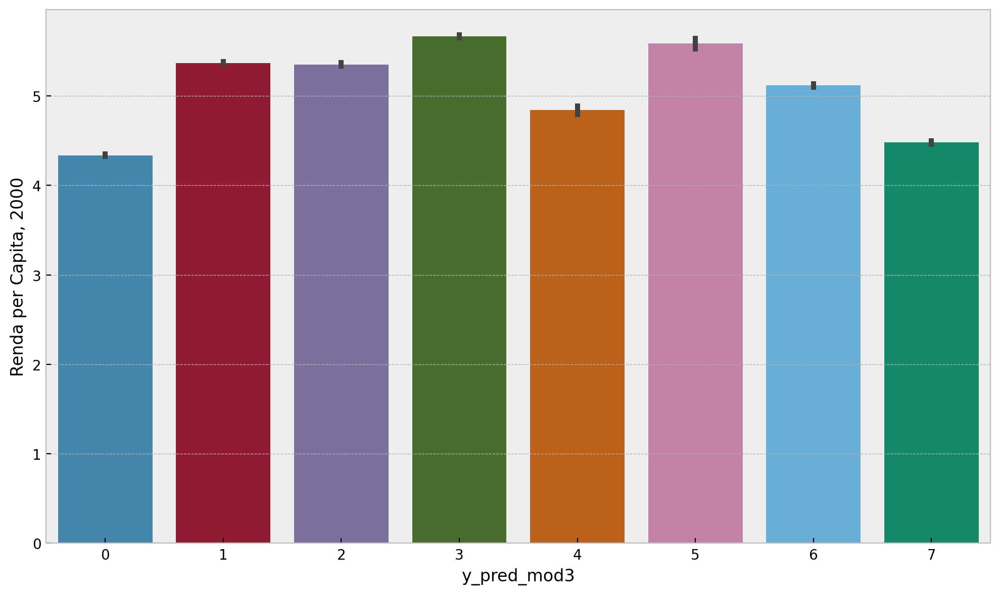

In [50]:
sns.barplot(x="y_pred_mod3", y="Renda per Capita, 2000", data=municipios_com_geo)

In [51]:
municipios_com_geo.groupby("y_pred_mod3").size()

y_pred_mod3
0    1173
1     867
2     504
3     761
4     444
5     199
6     739
7     820
dtype: int64

### Modelo 4

In [52]:
#df2 = serch_best_hyperparams(municipios_com_features2, 10, iterations=5, n_init=5)

In [53]:
#df2.sort_values("bic")

In [54]:
gm = GaussianMixture(n_components=8, random_state=42)
y_pred = gm.fit_predict(municipios_com_features2)
joblib.dump(gm, "../models/gmm2.pkl")

['../models/gmm2.pkl']

In [55]:
municipios_com_geo["y_pred_mod4"] = y_pred

<AxesSubplot: >

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


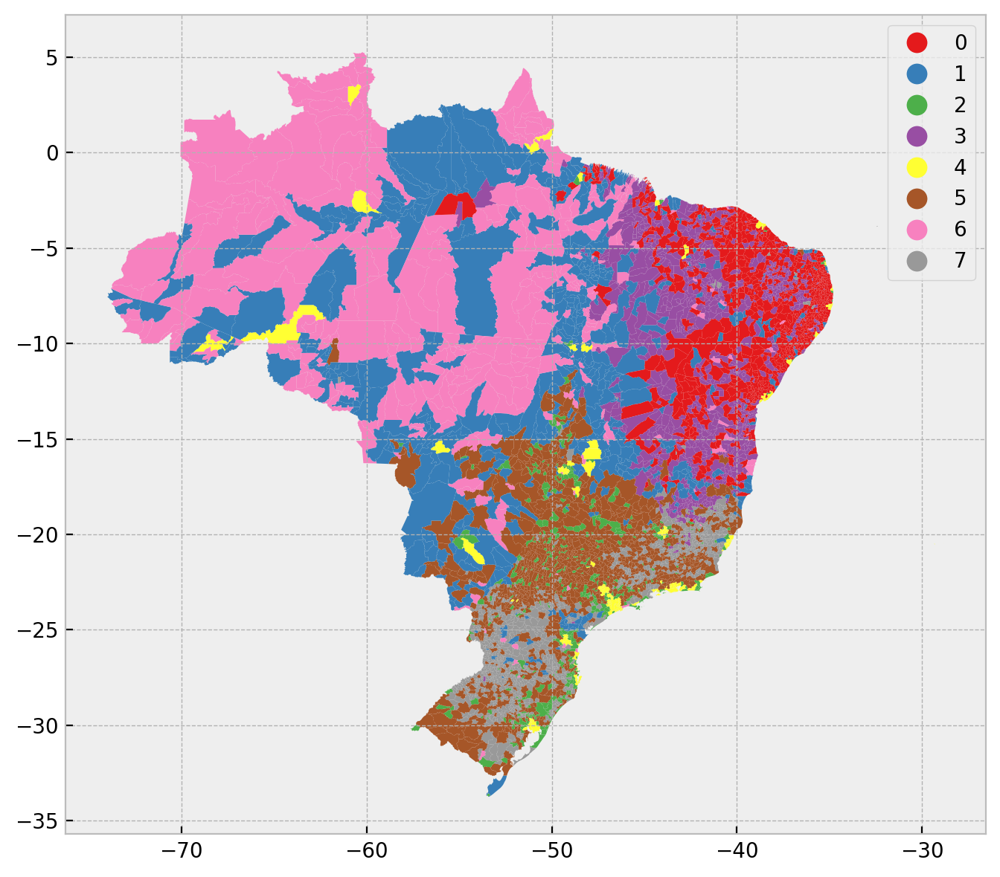

In [56]:
municipios_com_geo.plot(column="y_pred_mod4", legend=True, categorical=True, cmap="Set1")

<AxesSubplot: xlabel='y_pred_mod4', ylabel='Renda per Capita, 2000'>

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


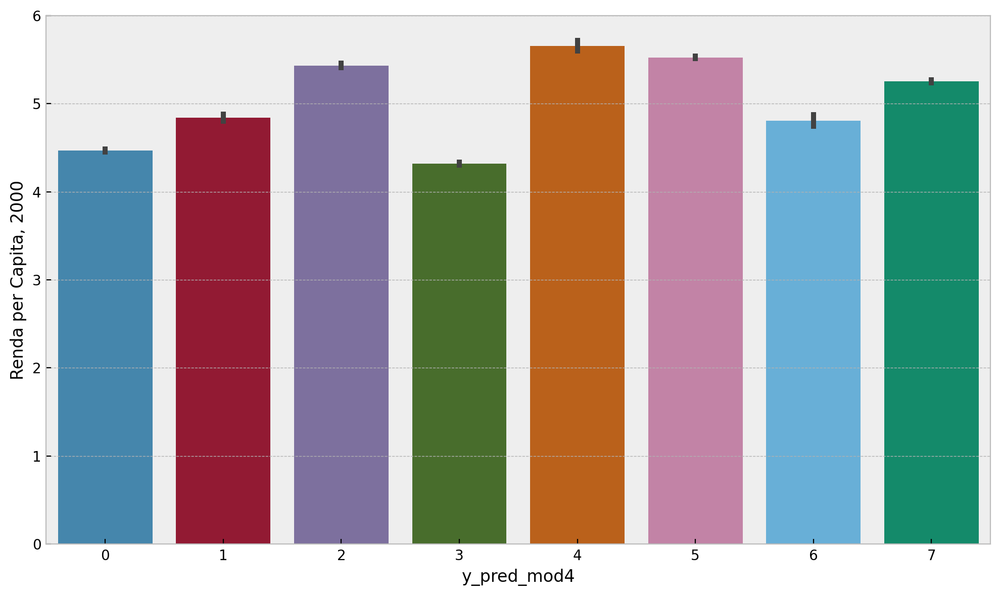

In [57]:
sns.barplot(x="y_pred_mod4", y="Renda per Capita, 2000", data=municipios_com_geo)

In [58]:
municipios_com_geo.groupby("y_pred_mod4").size()

y_pred_mod4
0     895
1     562
2     472
3     921
4     172
5    1137
6     297
7    1051
dtype: int64

### Características do Modelo 4

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


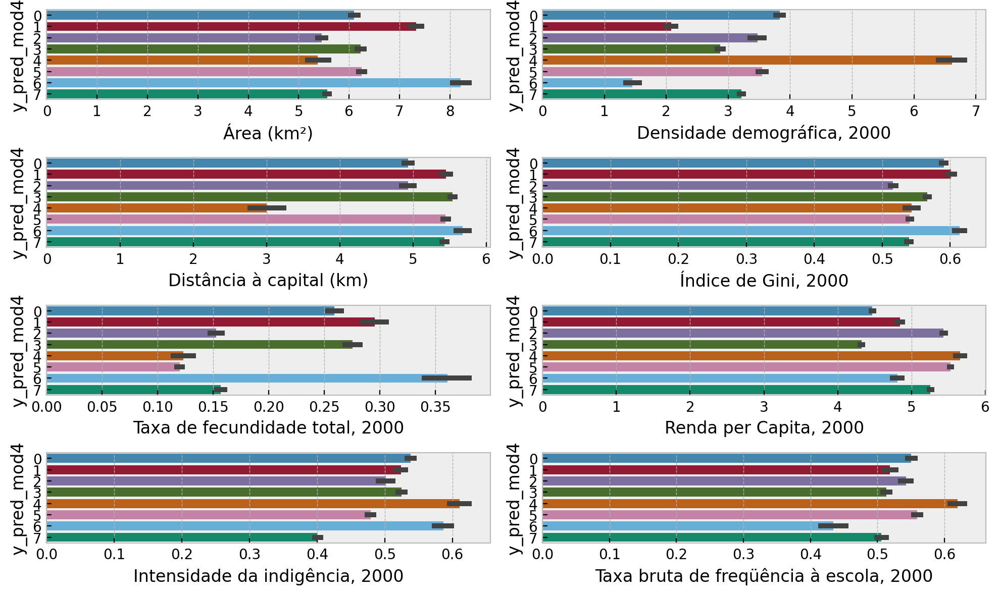

In [59]:
cols = [
    ['Área (km²)', 'Densidade demográfica, 2000'],
    ['Distância à capital (km)', 'Índice de Gini, 2000',],
    ['Taxa de fecundidade total, 2000', 'Renda per Capita, 2000'],
    ['Intensidade da indigência, 2000', 'Taxa bruta de freqüência à escola, 2000']
]

fig, ax = plt.subplot_mosaic(cols)


for row in cols:
    for col in row:
        sns.barplot(x=col, y="y_pred_mod4", data=municipios_com_geo, ax=ax[col], orient="h")

C:\Users\silasge\miniconda3\envs\case-plusoft\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


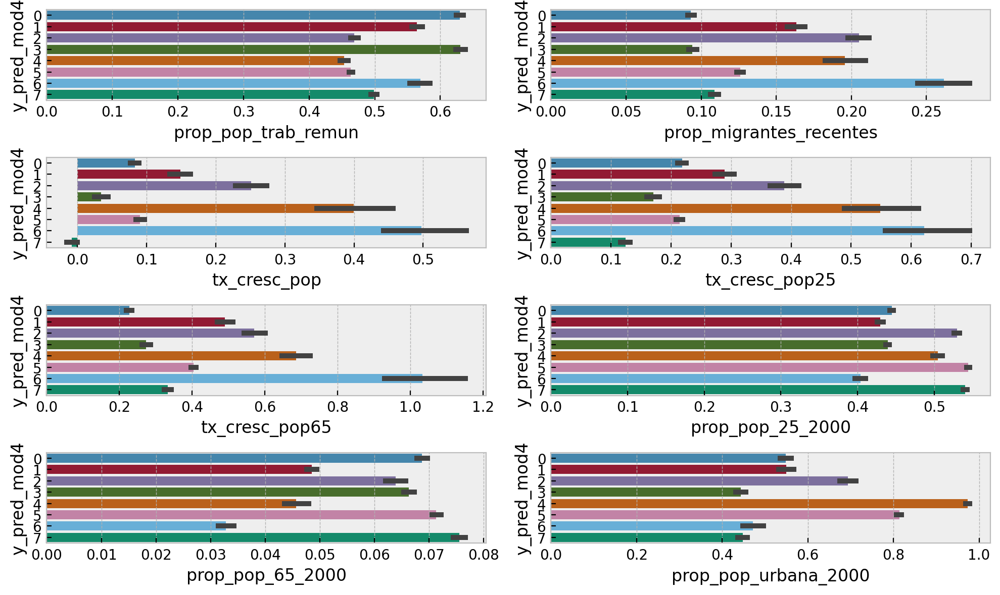

In [60]:
cols = [
    ['prop_pop_trab_remun', 'prop_migrantes_recentes'],
    ['tx_cresc_pop', 'tx_cresc_pop25'],
    ['tx_cresc_pop65', 'prop_pop_25_2000',],
    ['prop_pop_65_2000', 'prop_pop_urbana_2000']
]

fig, ax = plt.subplot_mosaic(cols)


for row in cols:
    for col in row:
        sns.barplot(x=col, y="y_pred_mod4", data=municipios_com_geo, ax=ax[col], orient="h")

## Modelagem - Classificação

In [61]:
X = municipios_com_geo[features_modelo2]
y = municipios_com_geo["y_pred_mod4"]

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [63]:
def objective(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 400)
    min_samples_split = trial.suggest_float("min_samples_split", 0, 1)
    min_samples_leaf = trial.suggest_float("min_samples_leaf", 0, 1)
    max_depth = trial.suggest_categorical("max_depth", [None, 5, 10, 15, 20])
    max_features = trial.suggest_float("max_features", 0, 1)
    class_weight = trial.suggest_categorical("class_weight", [None, "balanced", "balanced_subsample"])
    
    clf = RandomForestClassifier(
        n_estimators=n_estimators, 
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_depth=max_depth,
        max_features=max_features,
        class_weight=class_weight,
        random_state=42
    )
    
    accuracy = cross_val_score(clf, X_train, y_train, n_jobs=-1, cv=10)
    return np.mean(accuracy)

def study_optimize(objective=objective, path="../models/study.pkl", trials=50):
    if os.path.exists(path):
        study = joblib.load(path)
    else:
        study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=trials)
    joblib.dump(study, "../models/study.pkl")
    return study

study = study_optimize()

[I 2022-10-02 21:15:41,258] Trial 350 finished with value: 0.8118073593073593 and parameters: {'n_estimators': 150, 'min_samples_split': 0.0024860559939086577, 'min_samples_leaf': 0.00012678061710619378, 'max_depth': None, 'max_features': 0.2804589291923317, 'class_weight': None}. Best is trial 274 with value: 0.8181596578025149.
[I 2022-10-02 21:15:43,004] Trial 351 finished with value: 0.20635642135642135 and parameters: {'n_estimators': 151, 'min_samples_split': 0.0023571613101667733, 'min_samples_leaf': 0.3409543013084691, 'max_depth': None, 'max_features': 0.2832569503147531, 'class_weight': None}. Best is trial 274 with value: 0.8181596578025149.
[I 2022-10-02 21:15:46,600] Trial 352 finished with value: 0.5984193980622552 and parameters: {'n_estimators': 148, 'min_samples_split': 0.002001236246897372, 'min_samples_leaf': 0.0941039827117947, 'max_depth': None, 'max_features': 0.3015409177920953, 'class_weight': None}. Best is trial 274 with value: 0.8181596578025149.
[I 2022-10-0

In [64]:
study.best_trial.params

{'n_estimators': 183,
 'min_samples_split': 0.0006950940663198544,
 'min_samples_leaf': 6.84953650608236e-06,
 'max_depth': None,
 'max_features': 0.20117959445844186,
 'class_weight': None}

In [65]:
rf = RandomForestClassifier(random_state=42, **study.best_trial.params)
rf.fit(X_train, y_train)
y_preds = rf.predict_proba(X_test)
y_pred = rf.predict(X_test)

In [66]:
pd.DataFrame({"importances": rf.feature_importances_, "variable": X_test.columns}).sort_values("importances")

,importances,variable
7,0.029203,"Taxa bruta de freqüência à escola, 2000"
5,0.030936,"Índice de Gini, 2000"
3,0.044289,"Taxa de fecundidade total, 2000"
6,0.045066,"Intensidade da indigência, 2000"
11,0.046540,tx_cresc_pop25
10,0.048560,tx_cresc_pop
0,0.050605,Área (km²)
8,0.051665,prop_pop_trab_remun
14,0.052966,prop_pop_65_2000
12,0.053854,tx_cresc_pop65


In [67]:
print("Métricas no conjunto de teste:")
print("Acurácia:", rf.score(X_test, y_test))
print("ROC AUC:", roc_auc_score(y_test, y_preds, multi_class="ovo"))
print("Precision:", precision_score(y_test, y_pred, average="weighted"))
print("Recall:", recall_score(y_test, y_pred, average="weighted"))
print("F1 Score:", f1_score(y_test, y_pred, average="weighted"))

Métricas no conjunto de teste:
Acurácia: 0.809437386569873
ROC AUC: 0.976804273474065
Precision: 0.8119429662389401
Recall: 0.809437386569873
F1 Score: 0.8077072096347043
